In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sbn
import numpy as np
from IPython.display import IFrame
import shapefile as shp
import plotly.graph_objects as go
import os
pd.set_option('max_columns', None)
pd.set_option("max_rows", None)

# Carga de datos

In [2]:
mapa2=shp.Reader("alcaldias.shp")
data=pd.read_csv("escuelas-publicas.csv")
data.head(5)

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio
0,0,TELESECUNDARIA 63,DOMICILIO: ADMON U HAB CAMPAÑA DEL EBANO Y C C...,"-99.05424199980791,19.35316300009179,0",19.353163,-99.054242,"19.3531630001,-99.0542419998","ADMON U HAB CAMPAÑA DEL EBANO Y C CELAYA S/N, ..."
1,1,PREESCOLAR GENERAL CON SERVICIO ASISTENCIAL - ...,"DOMICILIO: PLAYA FLAMINGOS NO 1, MILITAR MARTE...","-99.12558263181295,19.37922441798433,0",19.379224,-99.125583,"19.379224418,-99.1255826318","PLAYA FLAMINGOS NO 1, MILITAR MARTE, DELEGACIO..."
2,2,PREESCOLAR GENERAL - ESTADO DE ZACATECAS,"DOMICILIO: CANAL DE SAN JUAN Y SUR 14 C, AGRIC...","-99.05933678879129,19.39268897307597,0",19.392689,-99.059337,"19.3926889731,-99.0593367888","CANAL DE SAN JUAN Y SUR 14 C, AGRICOLA ORIENTA..."
3,3,PRIMARIA GENERAL - PROFRA. AMANDA PALAFOX Y BAZ,"DOMICILIO: MONTE ELBRUZ NO 15, LOS VOLCANES, D...","-99.17674771482122,19.2697621281349,0",19.269762,-99.176748,"19.2697621281,-99.1767477148","MONTE ELBRUZ NO 15, LOS VOLCANES, DELEGACION T..."
4,4,PRIMARIA GENERAL - VALENTIN ZAMORA OROZCO,"DOMICILIO: RETORNO 33 Y 34 S/N, AVANTE, DELEGA...","-99.13093319192899,19.32847431855964,0",19.328474,-99.130933,"19.3284743186,-99.1309331919","RETORNO 33 Y 34 S/N, AVANTE, DELEGACION COYOAC..."


In [3]:
len(data)

2383

In [4]:
data["alcaldia"]= np.empty
for i in range(len(data["alcaldia"])):
    try:
        data["alcaldia"][i]=data["domicilio_con_nombre"][i].split("DELEGACION ")[1].split(",")[0]
    except:
        data["alcaldia"][i]="Sin alcaldia"

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1186781610.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["alcaldia"][i]=data["domicilio_con_nombre"][i].split("DELEGACION ")[1].split(",")[0]
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1186781610.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["alcaldia"][i]="Sin alcaldia"


In [5]:
data.alcaldia.value_counts()

IZTAPALAPA               439
GUSTAVO A. MADERO        369
CUAUHTEMOC               205
ALVARO OBREGON           171
COYOACAN                 163
AZCAPOTZALCO             154
VENUSTIANO CARRANZA      150
MIGUEL HIDALGO           137
IZTACALCO                131
TLAHUAC                  120
XOCHIMILCO                95
TLALPAN                   78
BENITO JUAREZ             68
Sin alcaldia              37
CUAJIMALPA DE MORELOS     35
MILPA ALTA                28
AZCAPOTZALCO OBREGON       2
ALVARO OBREGÓN             1
Name: alcaldia, dtype: int64

In [6]:
data[data["alcaldia"]=="ALVARO OBREGÓN"]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia
2137,2137,PRIMARIA GENERAL - REPUBLICA DE CAMERUN,"DOMICILIO: LUIS ECHEVERRÍA SN,COLONIA PRESIDEN...","-99.22200891337546,19.37773239601297,0",19.377732,-99.222009,"19.377732396,-99.2220089134","LUIS ECHEVERRÍA SN,COLONIA PRESIDENTES,DELEGAC...",ALVARO OBREGÓN


In [7]:
data["alcaldia"][2137]="ALVARO OBREGON"

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1979538487.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["alcaldia"][2137]="ALVARO OBREGON"


In [8]:
data.alcaldia.value_counts()

IZTAPALAPA               439
GUSTAVO A. MADERO        369
CUAUHTEMOC               205
ALVARO OBREGON           172
COYOACAN                 163
AZCAPOTZALCO             154
VENUSTIANO CARRANZA      150
MIGUEL HIDALGO           137
IZTACALCO                131
TLAHUAC                  120
XOCHIMILCO                95
TLALPAN                   78
BENITO JUAREZ             68
Sin alcaldia              37
CUAJIMALPA DE MORELOS     35
MILPA ALTA                28
AZCAPOTZALCO OBREGON       2
Name: alcaldia, dtype: int64

In [9]:
sinalcaldiaindex=data[data["alcaldia"]=="Sin alcaldia"].index
data[data["alcaldia"]=="Sin alcaldia"]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia
90,90,SECUNDARIA PARA TRABAJADORES - IGNACIO RAMIREZ,"JAIME TORRES BODET NUM 69, SANTA MARIA LA RIBERA","-99.15685887155227,19.45361198978437,0",19.453612,-99.156859,"19.4536119898,-99.1568588716",NaN,Sin alcaldia
94,94,PRIMARIA GENERAL - LUIS PENICHE VALLADO,"AV CECILIO ACOSTA S/N, ZAPOTITLA, AV CECILIO A...","-99.03787653959955,19.31199743780637,0",19.311997,-99.037877,"19.3119974378,-99.0378765396",NaN,Sin alcaldia
168,168,PREESCOLAR GENERAL - TLACOQUEMECATL,"DOCTOR VERTIZ NO 738,NARVARTE.","-99.15114600016342,19.39418900025015,0",19.394189,-99.151146,"19.3941890003,-99.1511460002",NaN,Sin alcaldia
225,225,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"CARLOS B. ZETINA NO. 32, HIPODROMO DE LA CONDESA","-99.18268699995568,19.40679000019233,0",19.406790,-99.182687,"19.4067900002,-99.182687",NaN,Sin alcaldia
407,407,SECUNDARIA GENERAL - MARIA ENRIQUETA CAMARILLO,"ESPERANZA ESQ CUAUHTEMOC, NARVARTE.","-99.15571700016679,19.40005500032287,0",19.400055,-99.155717,"19.4000550003,-99.1557170002",NaN,Sin alcaldia
435,435,PRIMARIA GENERAL - HEROES DE EL CARRIZAL,"AV AMERICAS NO 155, MODERNA.","-99.13415600009149,19.39887000009278,0",19.398870,-99.134156,"19.3988700001,-99.1341560001",NaN,Sin alcaldia
482,482,SECUNDARIA ANEXA A LA NORMAL SUPERIOR DE MEXICO,"DOMICILIO: RIBERA DE SAN COSME NO 83, SANTA MA...","-99.16107000009235,19.44195500004165,0",19.441955,-99.161070,"19.441955,-99.1610700001","RIBERA DE SAN COSME NO 83, SANTA MARIA LA RIBERA,",Sin alcaldia
567,567,PRIMARIA GENERAL - REINO UNIDO DE LA GRAN BRETAÑA,"MARTIN MENDALDE NO 1321, DEL VALLE.","-99.16814199988552,19.3801189998986,0",19.380119,-99.168142,"19.3801189999,-99.1681419999",NaN,Sin alcaldia
764,764,PRIMARIA GENERAL - 15 DE SEPTIEMBRE,"AV CUITLAHUAC Y AV CEYLAN S/N, AMPLIACION COSM...","-99.16121137376389,19.47235025204103,0",19.472350,-99.161211,"19.472350252,-99.1612113738",NaN,Sin alcaldia
804,804,SECUNDARIA GENERAL - MIGUEL DE CERVANTES SAAVEDRA,"ANAXAGORAS NO 324, NARVARTE.","-99.1568090002494,19.39651199998512,0",19.396512,-99.156809,"19.396512,-99.1568090002",NaN,Sin alcaldia


In [10]:
for i in sinalcaldiaindex:
    print(data["domicilio_con_nombre"][i])

JAIME TORRES BODET NUM 69, SANTA MARIA LA RIBERA
AV CECILIO ACOSTA S/N, ZAPOTITLA, AV CECILIO ACOSTA S/N ZAPOTITLA DOMICILIO:
DOCTOR VERTIZ NO 738,NARVARTE.
CARLOS B. ZETINA NO. 32, HIPODROMO DE LA CONDESA
ESPERANZA ESQ CUAUHTEMOC, NARVARTE.
AV AMERICAS NO 155, MODERNA.
DOMICILIO: RIBERA DE SAN COSME NO 83, SANTA MARIA LA RIBERA,
MARTIN MENDALDE NO 1321, DEL VALLE.
AV CUITLAHUAC Y AV CEYLAN S/N, AMPLIACION COSMOPOLITA.
ANAXAGORAS NO 324, NARVARTE.
NUEVA YORK Y PROL FILADELFIA,NAPOLES.
DOMICILIO: CAMINO A SANTA FE, PARAÍSO, ÁLVARO OBREGÓN, MEXICO DF
POLO NORTE NO 4, ANGEL ZIMBRON.
NORTE 67 NO 2915, OBRERO POPULAR.
CALZ GPE. NUM 166/AV RIO CONSULADO,PERALVILLO
OYAMEL Y CALZADA SAN SIMON, ATLAMPA
DOMICILIO: EMILIO CARRANZA NO 39, ALBERT, EMILIO CARRANZA NO 39 ALBERT.
JUAN DE DIOS ARIAS S/N ENTRE CHABACANO Y GUMERSIND,AMPLIACION ASTURIAS
DOMICILIO: ELISA ACUÐA Y ROSSETY NO.98 SANTA MARTHA ACATITLA
LERDO NO 242,UNIDAD NONOALCO TLATELOLCO
EJE CENTRAL LAZARO CARDENAS NO 302, UNIDAD NONOALCO T

In [11]:
data["alcaldia"][885]="ALVARO OBREGON"
data["alcaldia"][1956]="ALVARO OBREGON"
data["alcaldia"][994]="AZCAPOTZALCO"
data["alcaldia"][1142]="AZCAPOTZALCO"

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/3323427939.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["alcaldia"][885]="ALVARO OBREGON"
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/3323427939.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["alcaldia"][1956]="ALVARO OBREGON"
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/3323427939.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["alcaldia"][9

In [12]:
dalcaldias=data[["domicilio","alcaldia"]]

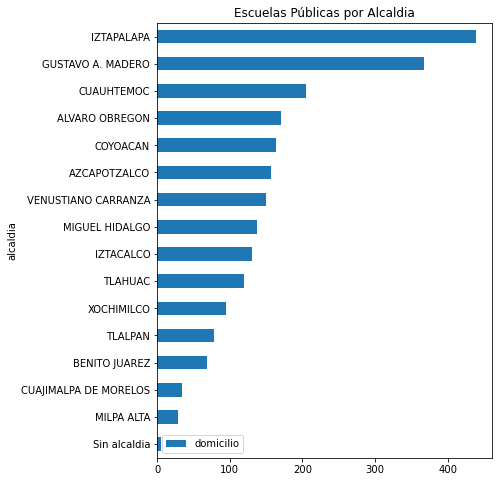

In [13]:
dalcaldias.groupby("alcaldia").count().nsmallest(20,"domicilio").plot(kind="barh", figsize=(6,8))
plt.title("Escuelas Públicas por Alcaldia")
plt.show()

In [14]:
def read_shapefile(sf):
    """
    Read a shapefile into a Pandas dataframe with a 'coords' 
    column holding the geometry information. This uses the pyshp
    package
    """
    fields = [x[0] for x in sf.fields][1:]
    records = sf.records()
    shps = [s.points for s in sf.shapes()]
    df = pd.DataFrame(columns=fields, data=records)
    df = df.assign(coords=shps)
    return df

In [15]:
def plot_map(sf, figsize = (20,20)):
    '''
    Plot map with lim coordinates
    '''
    plt.figure(figsize = figsize)
    id=0
    for shape in sf.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]
        y = [i[1] for i in shape.shape.points[:]]
        plt.plot(x, y, 'k')

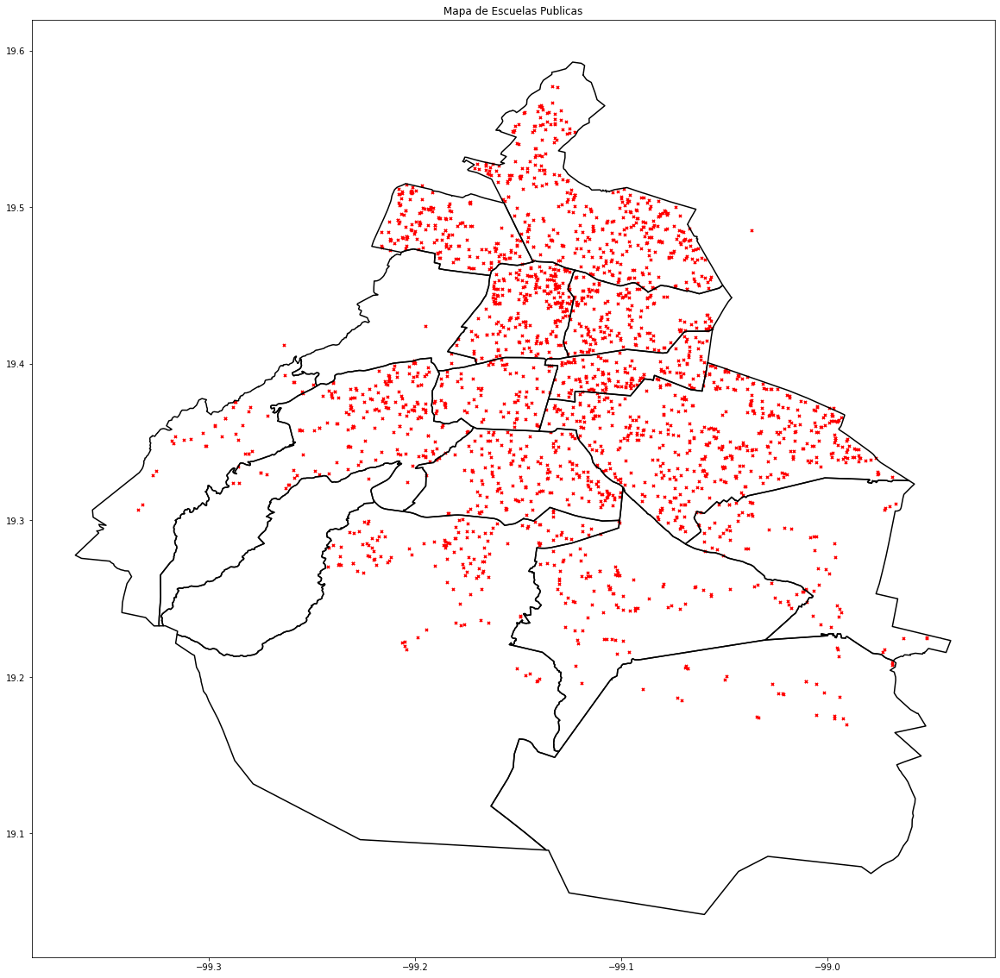

In [16]:
plot_map(mapa2)
escuelas=data["longitud"],data["latitud"]
plt.scatter(escuelas[0],escuelas[1],s=10,color="red",marker="x")
plt.title("Mapa de Escuelas Publicas")
plt.savefig("mapaEPUBLICAS.png")

In [17]:
data["nivel"]=np.empty
for i in range(len(data["nombre"])):
    data["nivel"][i]=data["nombre"][i].split(" ")[0]

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1830544204.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["nivel"][i]=data["nombre"][i].split(" ")[0]


In [18]:
data.head(5)

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
0,0,TELESECUNDARIA 63,DOMICILIO: ADMON U HAB CAMPAÑA DEL EBANO Y C C...,"-99.05424199980791,19.35316300009179,0",19.353163,-99.054242,"19.3531630001,-99.0542419998","ADMON U HAB CAMPAÑA DEL EBANO Y C CELAYA S/N, ...",IZTAPALAPA,TELESECUNDARIA
1,1,PREESCOLAR GENERAL CON SERVICIO ASISTENCIAL - ...,"DOMICILIO: PLAYA FLAMINGOS NO 1, MILITAR MARTE...","-99.12558263181295,19.37922441798433,0",19.379224,-99.125583,"19.379224418,-99.1255826318","PLAYA FLAMINGOS NO 1, MILITAR MARTE, DELEGACIO...",IZTACALCO,PREESCOLAR
2,2,PREESCOLAR GENERAL - ESTADO DE ZACATECAS,"DOMICILIO: CANAL DE SAN JUAN Y SUR 14 C, AGRIC...","-99.05933678879129,19.39268897307597,0",19.392689,-99.059337,"19.3926889731,-99.0593367888","CANAL DE SAN JUAN Y SUR 14 C, AGRICOLA ORIENTA...",IZTACALCO,PREESCOLAR
3,3,PRIMARIA GENERAL - PROFRA. AMANDA PALAFOX Y BAZ,"DOMICILIO: MONTE ELBRUZ NO 15, LOS VOLCANES, D...","-99.17674771482122,19.2697621281349,0",19.269762,-99.176748,"19.2697621281,-99.1767477148","MONTE ELBRUZ NO 15, LOS VOLCANES, DELEGACION T...",TLALPAN,PRIMARIA
4,4,PRIMARIA GENERAL - VALENTIN ZAMORA OROZCO,"DOMICILIO: RETORNO 33 Y 34 S/N, AVANTE, DELEGA...","-99.13093319192899,19.32847431855964,0",19.328474,-99.130933,"19.3284743186,-99.1309331919","RETORNO 33 Y 34 S/N, AVANTE, DELEGACION COYOAC...",COYOACAN,PRIMARIA


In [19]:
data.nivel.value_counts()

PRIMARIA          1151
PREESCOLAR         654
SECUNDARIA         335
ESCUELA             95
INTERVENCION        63
TELESECUNDARIA      39
LACTANTE,           30
ATENDER              6
LICENCIATURA         4
SUPERVISAR           2
CAPACITACION         1
JUAN                 1
SEC.                 1
BRINDAR              1
Name: nivel, dtype: int64

In [20]:
data["nivel"][1638]="SECUNDARIA"

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/2038645557.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["nivel"][1638]="SECUNDARIA"


In [21]:
data[data["nivel"]=="JUAN"]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
1447,1447,JUAN JACOBO ROUSSEAU,"DOMICILIO: VOLCAN LANIN Y ACATENANGO S/N, AMPL...","-99.07159099873481,19.47738426856628,0",19.477384,-99.071591,"19.4773842686,-99.0715909987","VOLCAN LANIN Y ACATENANGO S/N, AMPL PROVIDENCI...",GUSTAVO A. MADERO,JUAN


In [22]:
data.drop([1447],inplace=True)

In [23]:
data.nivel.unique()

array(['TELESECUNDARIA', 'PREESCOLAR', 'PRIMARIA', 'LACTANTE,', 'ESCUELA',
       'SECUNDARIA', 'INTERVENCION', 'LICENCIATURA', 'ATENDER',
       'CAPACITACION', 'BRINDAR', 'SUPERVISAR'], dtype=object)

In [24]:
data[data["nivel"]=="ESCUELA"]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
11,11,ESCUELA SECUNDARIA TECNICA 33,"DOMICILIO: ORIENTE 112 SUR 183, GABRIEL RAMOS ...","-99.09133324308804,19.38926398204175,0",19.389264,-99.091333,"19.389263982,-99.0913332431","ORIENTE 112 SUR 183, GABRIEL RAMOS MILLAN, DEL...",IZTACALCO,ESCUELA
32,32,ESCUELA SECUNDARIA TECNICA 44,DOMICILIO: FRANCISCO DEL PASO Y TRONCOSO Y CAL...,"-99.10849137138679,19.37742176395585,0",19.377422,-99.108491,"19.377421764,-99.1084913714",FRANCISCO DEL PASO Y TRONCOSO Y CALLE DEL ROSA...,IZTAPALAPA,ESCUELA
34,34,ESCUELA SECUNDARIA TECNICA 115,"DOMICILIO: AV. DEL PARAISO ESQ. CAPULIN, SAN M...","-98.99257647763812,19.3393236264426,0",19.339324,-98.992576,"19.3393236264,-98.9925764776","AV. DEL PARAISO ESQ. CAPULIN, SAN MIGUEL TEOTO...",IZTAPALAPA,ESCUELA
62,62,ESCUELA SECUNDARIA TECNICA 88,"DOMICILIO: CALLE PUERTO SAN BLAS No. 59 , COLO...","-99.2311079999983,19.37261899992764,0",19.372619,-99.231108,"19.3726189999,-99.231108","CALLE PUERTO SAN BLAS No. 59 , COLONIA PILOTO ...",ALVARO OBREGON,ESCUELA
70,70,ESCUELA SECUNDARIA TECNICA 42,"DOMICILIO: GOROSTIZA ESQ TENOCHTITLAN, MORELOS...","-99.12856000010643,19.45189399947041,0",19.451894,-99.128560,"19.4518939995,-99.1285600001","GOROSTIZA ESQ TENOCHTITLAN, MORELOS, DELEGACIO...",CUAUHTEMOC,ESCUELA
78,78,ESCUELA SECUNDARIA TECNICA 104,DOMICILIO: UNIDAD HABITACIONAL EL ARBOLITO DOS...,"-99.16373879127117,19.52544033536543,0",19.525440,-99.163739,"19.5254403354,-99.1637387913","UNIDAD HABITACIONAL EL ARBOLITO DOS, UNIDAD HA...",GUSTAVO A. MADERO,ESCUELA
96,96,ESCUELA SECUNDARIA TECNICA 116,DOMICILIO: CALLE MONTES PIRINEOS ESQUINA MAR D...,"-99.00830199979474,19.28897599991462,0",19.288976,-99.008302,"19.2889759999,-99.0083019998",CALLE MONTES PIRINEOS ESQUINA MAR DE LA CRISIS...,TLAHUAC,ESCUELA
100,100,ESCUELA SECUNDARIA TECNICA 7,"DOMICILIO: FERROCARRIL DE CINTURA NUM 85, MORE...","-99.12108700017193,19.43841299998218,0",19.438413,-99.121087,"19.438413,-99.1210870002","FERROCARRIL DE CINTURA NUM 85, MORELOS, DELEGA...",VENUSTIANO CARRANZA,ESCUELA
122,122,ESCUELA SECUNDARIA TECNICA 40,"DOMICILIO: AV DEL RIEGO S/N, VILLA COAPA, DELE...","-99.11894767246648,19.29326230390881,0",19.293262,-99.118948,"19.2932623039,-99.1189476725","AV DEL RIEGO S/N, VILLA COAPA, DELEGACION TLAL...",TLALPAN,ESCUELA
125,125,ESCUELA SECUNDARIA TECNICA 85,"DOMICILIO: CAMINO A CUAUTEPEC Y CHALMITA, EL A...","-99.1421249999032,19.52705199991905,0",19.527052,-99.142125,"19.5270519999,-99.1421249999","CAMINO A CUAUTEPEC Y CHALMITA, EL ARBOLILLO, D...",GUSTAVO A. MADERO,ESCUELA


In [25]:
data.loc[data['nivel'] == "ESCUELA", 'nivel'] = "SECUNDARIA TECNICA"

In [26]:
data.nivel.value_counts()

PRIMARIA              1151
PREESCOLAR             654
SECUNDARIA             336
SECUNDARIA TECNICA      95
INTERVENCION            63
TELESECUNDARIA          39
LACTANTE,               30
ATENDER                  6
LICENCIATURA             4
SUPERVISAR               2
CAPACITACION             1
BRINDAR                  1
Name: nivel, dtype: int64

In [27]:
data.isnull().sum()

id                        0
nombre                    0
domicilio_con_nombre      0
coordenadas             137
latitud                 141
longitud                139
geopoint                141
domicilio                36
alcaldia                  0
nivel                     0
dtype: int64

In [28]:
data[data.coordenadas.notnull() & data.latitud.isnull()]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
1654,1654,SECUNDARIA PARA TRABAJADORES 54,"DOMICILIO: JUAREZ NUM 38, COLONIA TIZAPAN, DEL...","-99.20375599991975,19.33627799991695,0",NaN,-99.203756,NaN,"JUAREZ NUM 38, COLONIA TIZAPAN, DELEGACION ALV...",ALVARO OBREGON,SECUNDARIA
1687,1687,PRIMARIA GENERAL - FLAVIO GUTIERREZ ZACARIAS,"DOMICILIO: AV HIDALGO S/N, COLONIA LA CADADA, ...","-99.23033238917901,19.3798171740474,0",NaN,-99.230332,NaN,"AV HIDALGO S/N, COLONIA LA CADADA, DELEGACION ...",ALVARO OBREGON,PRIMARIA
1749,1749,PRIMARIA GENERAL - ADOLFO RUIZ CORTINES,"DOMICILIO: BENITO JUAREZ NO 118, COLONIA BARRI...","-99.2090360002796,19.37882600017851,0",NaN,NaN,NaN,"BENITO JUAREZ NO 118, COLONIA BARRIO NORTE, DE...",ALVARO OBREGON,PRIMARIA
2324,2324,PRIMARIA GENERAL - MARIA LUISA ROSS,"DOMICILIO: HACIENDA DE LA FLOR SN,COLONIA PRES...","-99.2294090002806,19.37405600019276,0",NaN,NaN,NaN,"HACIENDA DE LA FLOR SN,COLONIA PRESIDENTES,DEL...",ALVARO OBREGON,PRIMARIA


In [29]:
data["latitud"][1654]=data["coordenadas"][1654].split(",")[-2]

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/2112237482.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["latitud"][1654]=data["coordenadas"][1654].split(",")[-2]


In [30]:
data.iloc[[1653]]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
1654,1654,SECUNDARIA PARA TRABAJADORES 54,"DOMICILIO: JUAREZ NUM 38, COLONIA TIZAPAN, DEL...","-99.20375599991975,19.33627799991695,0",19.336278,-99.203756,NaN,"JUAREZ NUM 38, COLONIA TIZAPAN, DELEGACION ALV...",ALVARO OBREGON,SECUNDARIA


In [31]:
data["latitud"][1687]=data["coordenadas"][1687].split(",")[-2]

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1925318348.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["latitud"][1687]=data["coordenadas"][1687].split(",")[-2]


In [32]:
data.iloc[[1686]]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
1687,1687,PRIMARIA GENERAL - FLAVIO GUTIERREZ ZACARIAS,"DOMICILIO: AV HIDALGO S/N, COLONIA LA CADADA, ...","-99.23033238917901,19.3798171740474,0",19.379817,-99.230332,NaN,"AV HIDALGO S/N, COLONIA LA CADADA, DELEGACION ...",ALVARO OBREGON,PRIMARIA


In [33]:
data["latitud"][1749]=data["coordenadas"][1687].split(",")[-2]
data["longitud"][1749]=data["coordenadas"][1687].split(",")[0]

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/3956096273.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["latitud"][1749]=data["coordenadas"][1687].split(",")[-2]
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/3956096273.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["longitud"][1749]=data["coordenadas"][1687].split(",")[0]


In [34]:
data.iloc[[1748]]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
1749,1749,PRIMARIA GENERAL - ADOLFO RUIZ CORTINES,"DOMICILIO: BENITO JUAREZ NO 118, COLONIA BARRI...","-99.2090360002796,19.37882600017851,0",19.379817,-99.230332,NaN,"BENITO JUAREZ NO 118, COLONIA BARRIO NORTE, DE...",ALVARO OBREGON,PRIMARIA


In [35]:
data["latitud"][2324]=data["coordenadas"][1687].split(",")[-2]
data["longitud"][2324]=data["coordenadas"][1687].split(",")[0]

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/4218139269.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["latitud"][2324]=data["coordenadas"][1687].split(",")[-2]
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/4218139269.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["longitud"][2324]=data["coordenadas"][1687].split(",")[0]


In [36]:
data.iloc[[2323]]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel
2324,2324,PRIMARIA GENERAL - MARIA LUISA ROSS,"DOMICILIO: HACIENDA DE LA FLOR SN,COLONIA PRES...","-99.2294090002806,19.37405600019276,0",19.379817,-99.230332,NaN,"HACIENDA DE LA FLOR SN,COLONIA PRESIDENTES,DEL...",ALVARO OBREGON,PRIMARIA


In [37]:
data[data.geopoint.notnull() & data.longitud.isnull()]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel


In [38]:
data[data.coordenadas.notnull() & data.latitud.isnull()]

,id,nombre,domicilio_con_nombre,coordenadas,latitud,longitud,geopoint,domicilio,alcaldia,nivel


In [39]:
data.isnull().sum()

id                        0
nombre                    0
domicilio_con_nombre      0
coordenadas             137
latitud                 137
longitud                137
geopoint                141
domicilio                36
alcaldia                  0
nivel                     0
dtype: int64

In [40]:
data.drop(columns=["geopoint","coordenadas","id"],inplace=True)

In [41]:
data.isnull().sum()

nombre                    0
domicilio_con_nombre      0
latitud                 137
longitud                137
domicilio                36
alcaldia                  0
nivel                     0
dtype: int64

In [42]:
data[data.domicilio.isnull()]

,nombre,domicilio_con_nombre,latitud,longitud,domicilio,alcaldia,nivel
65,PRIMARIA GENERAL - DR. SAMUEL RAMOS,"TIZIANO Y VAN OSTADE NO 8,COLONIA ALFONSO XIII...",19.374685,-99.198870,NaN,ALVARO OBREGON,PRIMARIA
89,PRIMARIA GENERAL - PROFRA. VIRGINIA RIVERA LOZANO,"ROMULO O'FARRIL S/N, COLONIA AMPLIACION LAS AG...",19.345200,-99.208786,NaN,ALVARO OBREGON,PRIMARIA
90,SECUNDARIA PARA TRABAJADORES - IGNACIO RAMIREZ,"JAIME TORRES BODET NUM 69, SANTA MARIA LA RIBERA",19.453612,-99.156859,NaN,Sin alcaldia,SECUNDARIA
94,PRIMARIA GENERAL - LUIS PENICHE VALLADO,"AV CECILIO ACOSTA S/N, ZAPOTITLA, AV CECILIO A...",19.311997,-99.037877,NaN,Sin alcaldia,PRIMARIA
168,PREESCOLAR GENERAL - TLACOQUEMECATL,"DOCTOR VERTIZ NO 738,NARVARTE.",19.394189,-99.151146,NaN,Sin alcaldia,PREESCOLAR
225,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"CARLOS B. ZETINA NO. 32, HIPODROMO DE LA CONDESA",19.406790,-99.182687,NaN,Sin alcaldia,SECUNDARIA
407,SECUNDARIA GENERAL - MARIA ENRIQUETA CAMARILLO,"ESPERANZA ESQ CUAUHTEMOC, NARVARTE.",19.400055,-99.155717,NaN,Sin alcaldia,SECUNDARIA
435,PRIMARIA GENERAL - HEROES DE EL CARRIZAL,"AV AMERICAS NO 155, MODERNA.",19.398870,-99.134156,NaN,Sin alcaldia,PRIMARIA
567,PRIMARIA GENERAL - REINO UNIDO DE LA GRAN BRETAÑA,"MARTIN MENDALDE NO 1321, DEL VALLE.",19.380119,-99.168142,NaN,Sin alcaldia,PRIMARIA
645,PRIMARIA GENERAL - HIDROELECTRICA DE CUPATITZIO,"DOMICILIO NORTE 92 B Y ORIENTE 171, LA ESMERAL...",19.486277,-99.086213,NaN,GUSTAVO A. MADERO,PRIMARIA


In [43]:
data.drop(columns=["domicilio"],inplace=True)

In [44]:
data.dropna(inplace=True)

In [45]:
data.isnull().sum()

nombre                  0
domicilio_con_nombre    0
latitud                 0
longitud                0
alcaldia                0
nivel                   0
dtype: int64

In [46]:
len(data)

2245

In [47]:
data.nivel.value_counts()

PRIMARIA              1090
PREESCOLAR             616
SECUNDARIA             317
SECUNDARIA TECNICA      92
INTERVENCION            53
TELESECUNDARIA          38
LACTANTE,               28
ATENDER                  5
LICENCIATURA             2
SUPERVISAR               2
CAPACITACION             1
BRINDAR                  1
Name: nivel, dtype: int64

In [48]:
len(data.loc[data['nombre'].str.contains("PRIMARIA")])

1143

In [49]:
data.loc[data['nombre'].str.contains("PRIMARIA", case=False) ]

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
3,PRIMARIA GENERAL - PROFRA. AMANDA PALAFOX Y BAZ,"DOMICILIO: MONTE ELBRUZ NO 15, LOS VOLCANES, D...",19.269762,-99.176748,TLALPAN,PRIMARIA
4,PRIMARIA GENERAL - VALENTIN ZAMORA OROZCO,"DOMICILIO: RETORNO 33 Y 34 S/N, AVANTE, DELEGA...",19.328474,-99.130933,COYOACAN,PRIMARIA
5,PRIMARIA GENERAL - VIDAL ALCOCER,"DOMICILIO: MAGISTERIO NACIONAL NO 102, TLALPAN...",19.282792,-99.166733,TLALPAN,PRIMARIA
9,PRIMARIA GENERAL - CHICHEN ITZA,"DOMICILIO: AV 5 DE MAYO S/N, SANTIAGO TEPALCAT...",19.250746,-99.126041,XOCHIMILCO,PRIMARIA
12,PRIMARIA GENERAL - ANAHUAXOCHITL,"DOMICILIO: PABLO L SIDAR ENTRE 35 Y 37 NTE, MO...",19.437561,-99.095166,VENUSTIANO CARRANZA,PRIMARIA
13,PRIMARIA GENERAL - PRESIDENTE VICENTE ROCAFUERTE,"DOMICILIO: COXCOX S/N Y RIO CHURUBUSCO, ARENAL...",19.422955,-99.056344,VENUSTIANO CARRANZA,PRIMARIA
15,PRIMARIA GENERAL - TEUHTLI,"DOMICILIO: AV INDEPENDENCIA NO 15, PUEBLO SAN ...",19.195771,-99.005714,MILPA ALTA,PRIMARIA
16,PRIMARIA GENERAL - PROFRA. GUADALUPE MAYOL DE ...,"DOMICILIO: SARASATE NO 94 BIS, PERALVILLO, DEL...",19.450117,-99.131868,CUAUHTEMOC,PRIMARIA
21,PRIMARIA GENERAL - NIÑOS HEROES,"DOMICILIO: CALLE SANTA RITA NO 230, LOMAS DEL ...",19.351992,-99.308974,CUAJIMALPA DE MORELOS,PRIMARIA
24,PRIMARIA GENERAL - PRESIDENTE PLUTARCO ELIAS C...,"DOMICILIO: AV PLUTARCO ELIAS CALLES NO 972, RE...",19.390297,-99.132355,IZTACALCO,PRIMARIA


In [50]:
len(data[(data['nombre'].str.contains('PRIMARIA')) & (~data['nivel'].str.contains('PRIMARIA'))])

53

In [51]:
data[(data['nombre'].str.contains('PRIMARIA')) & (~data['nivel'].str.contains('PRIMARIA'))]

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
36,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...",DOMICILIO: CAMINO CERRO DE LA ESTRELLA S/N EDI...,19.354618,-99.090529,IZTAPALAPA,INTERVENCION
43,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: CASTILLA NO 148, ALAMOS, DELEGACIO...",19.397659,-99.142742,BENITO JUAREZ,INTERVENCION
77,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: FRAY PEDRO DE GANTE NO 43, VASCO D...",19.493922,-99.094438,GUSTAVO A. MADERO,INTERVENCION
107,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: IRIS S/N, JARDINES DE COYOACAN, DEL...",19.313409,-99.126296,COYOACAN,INTERVENCION
130,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: MELCHOR OCAMPO NO 1, SANTO TOMAS A...",19.219836,-99.205328,TLAHUAC,INTERVENCION
170,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: AV BENITO JUAREZ S/N, MIXCOATL, DEL...",19.325270,-99.050322,IZTAPALAPA,INTERVENCION
175,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: COMERCIO NO 43, PUEBLO STA CRUZ XO...",19.259362,-99.130412,XOCHIMILCO,INTERVENCION
205,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: MORAS 634, DEL VALLE, DELEGACION BE...",19.368836,-99.174996,BENITO JUAREZ,INTERVENCION
222,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: FCO MARQUEZ NO 144, CONDESA, DELE...",19.412284,-99.180113,CUAUHTEMOC,INTERVENCION
276,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: XICOTENCATL NO 164, EL CARMEN, DEL...",19.354760,-99.153503,COYOACAN,INTERVENCION


In [52]:
len(data.loc[data['nombre'].str.contains("PREESCOLAR")])

700

In [53]:
len(data[(data['nombre'].str.contains('PREESCOLAR')) & (~data['nivel'].str.contains('PREESCOLAR'))])

84

In [54]:
data[(data['nombre'].str.contains('PREESCOLAR')) & (~data['nivel'].str.contains('PREESCOLAR'))]

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
7,"LACTANTE, MATERNAL Y PREESCOLAR - CENDI SEP NO...","DOMICILIO: JOSEFA ORTIZ DE DOMINGUEZ S/N, LA G...",19.265049,-99.101505,XOCHIMILCO,"LACTANTE,"
36,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...",DOMICILIO: CAMINO CERRO DE LA ESTRELLA S/N EDI...,19.354618,-99.090529,IZTAPALAPA,INTERVENCION
43,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: CASTILLA NO 148, ALAMOS, DELEGACIO...",19.397659,-99.142742,BENITO JUAREZ,INTERVENCION
77,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: FRAY PEDRO DE GANTE NO 43, VASCO D...",19.493922,-99.094438,GUSTAVO A. MADERO,INTERVENCION
82,"LACTANTE, MATERNAL Y PREESCOLAR - CENDI SEP NO...","DOMICILIO: RETORNO 801 M-8 NO 18, EL CENTINELA...",19.337480,-99.140899,COYOACAN,"LACTANTE,"
107,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: IRIS S/N, JARDINES DE COYOACAN, DEL...",19.313409,-99.126296,COYOACAN,INTERVENCION
130,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: MELCHOR OCAMPO NO 1, SANTO TOMAS A...",19.219836,-99.205328,TLAHUAC,INTERVENCION
170,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: AV BENITO JUAREZ S/N, MIXCOATL, DEL...",19.325270,-99.050322,IZTAPALAPA,INTERVENCION
175,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: COMERCIO NO 43, PUEBLO STA CRUZ XO...",19.259362,-99.130412,XOCHIMILCO,INTERVENCION
205,"INTERVENCION TEMPRANA, PREESCOLAR, PRIMARIA Y ...","DOMICILIO: MORAS 634, DEL VALLE, DELEGACION BE...",19.368836,-99.174996,BENITO JUAREZ,INTERVENCION


In [55]:
len(data.loc[data['nombre'].str.contains("SECUNDARIA", case=False)])

446

In [56]:
data.loc[data['nombre'].str.contains("SECUNDARIA", case=False)]

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
0,TELESECUNDARIA 63,DOMICILIO: ADMON U HAB CAMPAÑA DEL EBANO Y C C...,19.353163,-99.054242,IZTAPALAPA,TELESECUNDARIA
11,ESCUELA SECUNDARIA TECNICA 33,"DOMICILIO: ORIENTE 112 SUR 183, GABRIEL RAMOS ...",19.389264,-99.091333,IZTACALCO,SECUNDARIA TECNICA
23,SECUNDARIA GENERAL - JOSE GUADALUPE NAJERA JIM...,DOMICILIO: CERRO MERCADO Y CERRO SAN FRANCISCO...,19.344654,-99.132063,COYOACAN,SECUNDARIA
32,ESCUELA SECUNDARIA TECNICA 44,DOMICILIO: FRANCISCO DEL PASO Y TRONCOSO Y CAL...,19.377422,-99.108491,IZTAPALAPA,SECUNDARIA TECNICA
34,ESCUELA SECUNDARIA TECNICA 115,"DOMICILIO: AV. DEL PARAISO ESQ. CAPULIN, SAN M...",19.339324,-98.992576,IZTAPALAPA,SECUNDARIA TECNICA
40,SECUNDARIA GENERAL - UNION DE REPUBLICAS SOCIA...,"DOMICILIO: CIENFUEGOS NO 1069, LINDAVISTA, DEL...",19.501021,-99.122765,GUSTAVO A. MADERO,SECUNDARIA
41,SECUNDARIA GENERAL - GUSTAVO A MADERO,"DOMICILIO: PUERTO MAZATLAN Y MOCTEZUMA, LA PAS...",19.523681,-99.139831,GUSTAVO A. MADERO,SECUNDARIA
51,SECUNDARIA GENERAL - JOSE NATIVIDAD MACIAS,"DOMICILIO: LIC NATIVIDAD Y FRANCISCO ANDRADE, ...",19.351157,-99.067261,IZTAPALAPA,SECUNDARIA
57,SECUNDARIA GENERAL - RAMON BETETA,"DOMICILIO: OAXACA S/N ESQ YUCATAN, PUEBLO SN S...",19.360621,-99.015900,IZTAPALAPA,SECUNDARIA
58,SECUNDARIA GENERAL - JAPON,"DOMICILIO: VERGEL Y 5 DE MAYO, SANTA CRUZ MEYE...",19.340676,-99.048886,IZTAPALAPA,SECUNDARIA


In [57]:
len(data.loc[data['nombre'].str.contains("SECUNDARIA TECNICA", case=False)])

107

In [58]:
data[(data['nombre'].str.contains('SECUNDARIA TECNICA')) & (~data['nivel'].str.contains('SECUNDARIA TECNICA'))]

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
164,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"DOMICILIO: AV. 414 A Y CALLE 1537 Y 1543, U SA...",19.466567,-99.063425,GUSTAVO A. MADERO,SECUNDARIA
225,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"CARLOS B. ZETINA NO. 32, HIPODROMO DE LA CONDESA",19.406790,-99.182687,Sin alcaldia,SECUNDARIA
236,SECUNDARIA TECNICA 47,"DOMICILIO: AV INSURGENTES NORTE 1114, TLACAMAC...",19.474593,-99.135147,GUSTAVO A. MADERO,SECUNDARIA
380,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,DOMICILIO: AV. SUR DE LOS 100 METROS S/N ENTRE...,19.484556,-99.145923,GUSTAVO A. MADERO,SECUNDARIA
439,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"DOMICILIO: PROL HORTENCIAS Y PIRUL S/N, SAN LO...",19.295618,-99.070201,IZTAPALAPA,SECUNDARIA
488,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"DOMICILIO: AV. ESCUINAPA Y PAPALOTL S/N, PEDRE...",19.329730,-99.162901,COYOACAN,SECUNDARIA
665,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,DOMICILIO: SAN ALEJANDRO ESQ. SAN JORGE Y SAN ...,19.307575,-99.155700,COYOACAN,SECUNDARIA
836,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,DOMICILIO: SEGUNDA Y TERCERA CERRADA DE MOCTEZ...,19.328878,-99.194828,COYOACAN,SECUNDARIA
1031,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"DOMICILIO: SABINOS 47, SANTA ANITA, DELEGACION...",19.403384,-99.123212,IZTACALCO,SECUNDARIA
1306,SECUNDARIA TECNICA INDUSTRIAL - ESCUELA SECUND...,"DOMICILIO: PROL GUERRERO S/N, PUEBLO SAN PABLO...",19.185322,-99.070734,MILPA ALTA,SECUNDARIA


In [59]:
data["nivel"][164]="SECUNDARIA TECNICA"
data["nivel"][225]="SECUNDARIA TECNICA"
data["nivel"][236]="SECUNDARIA TECNICA"
data["nivel"][380]="SECUNDARIA TECNICA"
data["nivel"][439]="SECUNDARIA TECNICA"
data["nivel"][488]="SECUNDARIA TECNICA"
data["nivel"][665]="SECUNDARIA TECNICA"
data["nivel"][836]="SECUNDARIA TECNICA"
data["nivel"][1031]="SECUNDARIA TECNICA"
data["nivel"][1306]="SECUNDARIA TECNICA"
data["nivel"][1363]="SECUNDARIA TECNICA"
data["nivel"][1394]="SECUNDARIA TECNICA"
data["nivel"][1472]="SECUNDARIA TECNICA"
data["nivel"][1575]="SECUNDARIA TECNICA"
data["nivel"][1695]="SECUNDARIA TECNICA"
data["nivel"][1776]="SECUNDARIA TECNICA"
data["nivel"][2213]="SECUNDARIA TECNICA"

C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1525917952.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["nivel"][164]="SECUNDARIA TECNICA"
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1525917952.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["nivel"][225]="SECUNDARIA TECNICA"
C:\Users\Studio\AppData\Local\Temp/ipykernel_31000/1525917952.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["nivel"][236

In [60]:
len(data.loc[data['nombre'].str.contains("INTERVENCION ", case=False)])

53

In [61]:
len(data.loc[data['nombre'].str.contains("TELESECUNDARIA", case=False)])

38

In [62]:
len(data.loc[data['nombre'].str.contains("LACTANTE", case=False)])

28

In [63]:
len(data.loc[data['nombre'].str.contains("ATENDER", case=False)])

5

In [64]:
len(data.loc[data['nombre'].str.contains("LICENCIATURA", case=False)])

2

In [65]:
len(data.loc[data['nombre'].str.contains("SUPERVISAR", case=False)])

2

In [66]:
len(data.loc[data['nombre'].str.contains("CAPACITACION", case=False)])

51

In [67]:
data[(data['nombre'].str.contains('CAPACITACION')) & (~data['nivel'].str.contains('INTERVENCION'))]

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
795,CAPACITACION PARA EL TRABAJO - ESCUELA PARA AS...,"DOMICILIO: ANZAR S/N, GRANJAS MODERNAS, DELEGA...",19.479487,-99.104079,GUSTAVO A. MADERO,CAPACITACION


In [68]:
len(data.loc[data['nombre'].str.contains("BRINDAR", case=False)])

1

In [69]:
import folium
some_map = folium.Map(location=[data.latitud.mean(),
                               data.longitud.mean()],
                               zoom_start=10)
some_map_2 = folium.Map(location=[data.latitud.mean(),
                               data.longitud.mean()],
                               zoom_start=10)
map3 = folium.Map(location=[data.latitud.mean(),
                               data.longitud.mean()],
                               zoom_start=10)

In [70]:
for (index,row) in data.iterrows():
    folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click").add_to(some_map)

In [71]:
some_map

In [72]:
from folium.plugins import MarkerCluster

In [73]:
mc = MarkerCluster()

In [74]:
for (index,row) in data.iterrows():
    mc.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [75]:
some_map_2.add_child(mc)

In [76]:
from folium import plugins

In [77]:
PRIMARIA_publica=data[data["nivel"]=="PRIMARIA"]
PREESCOLAR_publica=data[data["nivel"]=="PREESCOLAR"]
SECUNDARIA_publica=data[data["nivel"]=="SECUNDARIA"]
SECUNDARIATECNICA_publica=data[data["nivel"]=="SECUNDARIA TECNICA"]
INTERVENCION_publica=data[data["nivel"]=="INTERVENCION"]
TELESECUNDARIA_publica=data[data["nivel"]=="TELESECUNDARIA"]
LACTANTE_publica=data[data["nivel"]=="LACTANTE,"]
ATENDER_publica=data[data["nivel"]=="ATENDER"]
LICENCIATURA_publica=data[data["nivel"]=="LICENCIATURA"]
SUPERVISAR_publica=data[data["nivel"]=="SUPERVISAR"]
BRINDAR_publica=data[data["nivel"]=="BRINDAR"]
CAPACITACION_publica=data[data["nivel"]=="CAPACITACION"]

In [78]:
map3 = folium.Map(location=[data.latitud.mean(),
                               data.longitud.mean()],
                               zoom_start=10)
mcg= folium.plugins.MarkerCluster(control=False)
map3.add_child(mcg)

In [79]:
SECUNDARIATECNICA_publica

,nombre,domicilio_con_nombre,latitud,longitud,alcaldia,nivel
11,ESCUELA SECUNDARIA TECNICA 33,"DOMICILIO: ORIENTE 112 SUR 183, GABRIEL RAMOS ...",19.389264,-99.091333,IZTACALCO,SECUNDARIA TECNICA
32,ESCUELA SECUNDARIA TECNICA 44,DOMICILIO: FRANCISCO DEL PASO Y TRONCOSO Y CAL...,19.377422,-99.108491,IZTAPALAPA,SECUNDARIA TECNICA
34,ESCUELA SECUNDARIA TECNICA 115,"DOMICILIO: AV. DEL PARAISO ESQ. CAPULIN, SAN M...",19.339324,-98.992576,IZTAPALAPA,SECUNDARIA TECNICA
62,ESCUELA SECUNDARIA TECNICA 88,"DOMICILIO: CALLE PUERTO SAN BLAS No. 59 , COLO...",19.372619,-99.231108,ALVARO OBREGON,SECUNDARIA TECNICA
70,ESCUELA SECUNDARIA TECNICA 42,"DOMICILIO: GOROSTIZA ESQ TENOCHTITLAN, MORELOS...",19.451894,-99.128560,CUAUHTEMOC,SECUNDARIA TECNICA
78,ESCUELA SECUNDARIA TECNICA 104,DOMICILIO: UNIDAD HABITACIONAL EL ARBOLITO DOS...,19.525440,-99.163739,GUSTAVO A. MADERO,SECUNDARIA TECNICA
96,ESCUELA SECUNDARIA TECNICA 116,DOMICILIO: CALLE MONTES PIRINEOS ESQUINA MAR D...,19.288976,-99.008302,TLAHUAC,SECUNDARIA TECNICA
100,ESCUELA SECUNDARIA TECNICA 7,"DOMICILIO: FERROCARRIL DE CINTURA NUM 85, MORE...",19.438413,-99.121087,VENUSTIANO CARRANZA,SECUNDARIA TECNICA
122,ESCUELA SECUNDARIA TECNICA 40,"DOMICILIO: AV DEL RIEGO S/N, VILLA COAPA, DELE...",19.293262,-99.118948,TLALPAN,SECUNDARIA TECNICA
125,ESCUELA SECUNDARIA TECNICA 85,"DOMICILIO: CAMINO A CUAUTEPEC Y CHALMITA, EL A...",19.527052,-99.142125,GUSTAVO A. MADERO,SECUNDARIA TECNICA


In [80]:
g3=folium.plugins.FeatureGroupSubGroup(mcg,"Preescolar")
map3.add_child(g3)
for (index,row) in PREESCOLAR_publica.iterrows():
    g3.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [81]:
g1=folium.plugins.FeatureGroupSubGroup(mcg,"Primarias")
map3.add_child(g1)
for (index,row) in PRIMARIA_publica.iterrows():
    g1.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [82]:
g2=folium.plugins.FeatureGroupSubGroup(mcg,"Secundarias")
map3.add_child(g2)
for (index,row) in SECUNDARIA_publica.iterrows():
    g2.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [83]:
g6=folium.plugins.FeatureGroupSubGroup(mcg,"Telesecundaria")
map3.add_child(g6)
for (index,row) in TELESECUNDARIA_publica.iterrows():
    g6.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [84]:
g4=folium.plugins.FeatureGroupSubGroup(mcg,"Sec.Tecnica")
map3.add_child(g4)
for (index,row) in SECUNDARIATECNICA_publica.iterrows():
    g4.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [85]:
g9=folium.plugins.FeatureGroupSubGroup(mcg,"Licenciatura")
map3.add_child(g9)
for (index,row) in LICENCIATURA_publica.iterrows():
    g9.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [86]:
g5=folium.plugins.FeatureGroupSubGroup(mcg,"Intervencion")
map3.add_child(g5)
for (index,row) in INTERVENCION_publica.iterrows():
    g5.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [87]:
g7=folium.plugins.FeatureGroupSubGroup(mcg,"Lactante")
map3.add_child(g7)
for (index,row) in LACTANTE_publica.iterrows():
    g7.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [88]:
g8=folium.plugins.FeatureGroupSubGroup(mcg,"Atender")
map3.add_child(g8)
for (index,row) in ATENDER_publica.iterrows():
    g8.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [89]:
g10=folium.plugins.FeatureGroupSubGroup(mcg,"Supervisar")
map3.add_child(g10)
for (index,row) in SUPERVISAR_publica.iterrows():
    g10.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [90]:
g11=folium.plugins.FeatureGroupSubGroup(mcg,"Capacitacion")
map3.add_child(g11)
for (index,row) in CAPACITACION_publica.iterrows():
    g11.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [91]:
g12=folium.plugins.FeatureGroupSubGroup(mcg,"Brindar")
map3.add_child(g12)
for (index,row) in BRINDAR_publica.iterrows():
    g12.add_child(folium.Marker(location=[row.loc["latitud"],row.loc["longitud"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [92]:
folium.LayerControl(collapsed=False).add_to(map3)

In [93]:
map3

In [94]:
print(data.nivel.value_counts())
print(len(data))

PRIMARIA              1090
PREESCOLAR             616
SECUNDARIA             300
SECUNDARIA TECNICA     109
INTERVENCION            53
TELESECUNDARIA          38
LACTANTE,               28
ATENDER                  5
LICENCIATURA             2
SUPERVISAR               2
CAPACITACION             1
BRINDAR                  1
Name: nivel, dtype: int64
2245


In [95]:
nivel = data.nivel.value_counts().rename_axis('nivel').to_frame('Conteos')
nivel

,Conteos
nivel,
PRIMARIA,1090
PREESCOLAR,616
SECUNDARIA,300
SECUNDARIA TECNICA,109
INTERVENCION,53
TELESECUNDARIA,38
"LACTANTE,",28
ATENDER,5
LICENCIATURA,2


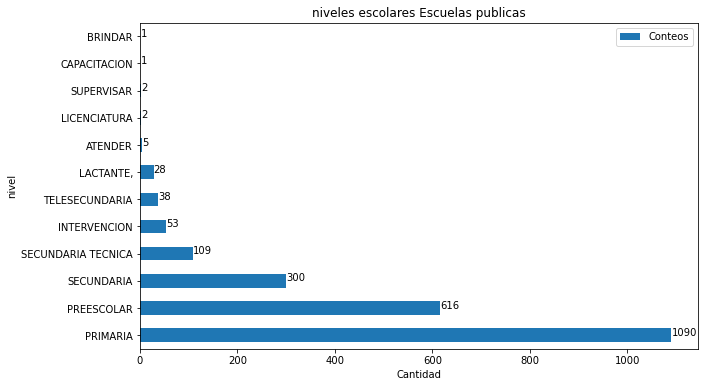

In [96]:
nivel.plot(kind="barh",figsize=(10,6))
for index, value in enumerate(nivel.Conteos):
    plt.text(value, index, str(value))
plt.title("niveles escolares Escuelas publicas")
plt.xlabel("Cantidad")
plt.ylabel("nivel")
plt.savefig("niveles escolares Publicas",bbox_inches='tight')
plt.show()

In [97]:
alcaldias = data.alcaldia.value_counts().rename_axis('Alcaldia').to_frame('Escuelas')
alcaldias

,Escuelas
Alcaldia,
IZTAPALAPA,439
GUSTAVO A. MADERO,368
CUAUHTEMOC,205
ALVARO OBREGON,174
COYOACAN,163
AZCAPOTZALCO,156
VENUSTIANO CARRANZA,150
IZTACALCO,131
TLAHUAC,120


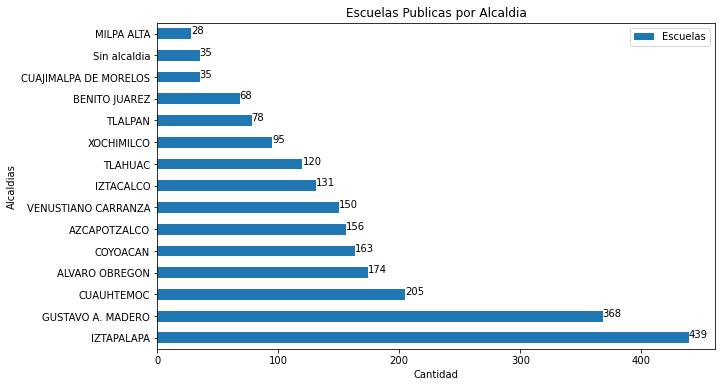

In [98]:
alcaldias.plot(kind="barh",figsize=(10,6))
for index, value in enumerate(alcaldias.Escuelas):
    plt.text(value,index, str(value))
plt.title("Escuelas Publicas por Alcaldia")
plt.xlabel("Cantidad")
plt.ylabel("Alcaldias")
plt.savefig("Escuelas por Alcaldia Publicas",bbox_inches='tight')
plt.show()

In [99]:
alcaldias.reset_index(inplace=True)
alcaldias.Alcaldia=alcaldias.Alcaldia.str.casefold()
alcaldias

,Alcaldia,Escuelas
0,iztapalapa,439
1,gustavo a. madero,368
2,cuauhtemoc,205
3,alvaro obregon,174
4,coyoacan,163
5,azcapotzalco,156
6,venustiano carranza,150
7,iztacalco,131
8,tlahuac,120
9,xochimilco,95


In [100]:
inegi=pd.read_csv("Poblacion.csv")
inegi.head()

,Unnamed: 0,Alcaldia,Habitantes
0,0,Azcapotzalco,"432,205"
1,1,Coyoacán,"614,447"
2,2,Cuajimalpa de Morelos,"217,686"
3,3,Gustavo A. Madero,"1,173,351"
4,4,Iztacalco,"404,695"


In [101]:
inegi.drop(columns=["Unnamed: 0"],inplace=True)
inegi.Alcaldia=inegi.Alcaldia.str.casefold()
inegi

,Alcaldia,Habitantes
0,azcapotzalco,"432,205"
1,coyoacán,"614,447"
2,cuajimalpa de morelos,"217,686"
3,gustavo a. madero,"1,173,351"
4,iztacalco,"404,695"
5,iztapalapa,"1,835,486"
6,la magdalena contreras,"247,622"
7,milpa alta,"152,685"
8,álvaro obregón,"759,137"
9,tláhuac,"392,313"


In [102]:
inegi.Alcaldia = inegi.Alcaldia.str.replace('á','a')
inegi.Alcaldia = inegi.Alcaldia.str.replace('é','e')
inegi.Alcaldia = inegi.Alcaldia.str.replace('ó','o')

In [103]:
escuelasypoblacion=(pd.merge(inegi, alcaldias, on='Alcaldia'))
escuelasypoblacion

,Alcaldia,Habitantes,Escuelas
0,azcapotzalco,"432,205",156
1,coyoacan,"614,447",163
2,cuajimalpa de morelos,"217,686",35
3,gustavo a. madero,"1,173,351",368
4,iztacalco,"404,695",131
5,iztapalapa,"1,835,486",439
6,milpa alta,"152,685",28
7,alvaro obregon,"759,137",174
8,tlahuac,"392,313",120
9,tlalpan,"699,928",78


In [104]:
escuelasypoblacion.Habitantes = escuelasypoblacion.Habitantes.str.replace(',','')

In [105]:
escuelasypoblacion.Habitantes=escuelasypoblacion.Habitantes.astype(int)

In [106]:
escuelasypoblacion.sort_values("Habitantes",inplace=True)

In [107]:
escuelasypoblacion

,Alcaldia,Habitantes,Escuelas
6,milpa alta,152685,28
2,cuajimalpa de morelos,217686,35
8,tlahuac,392313,120
4,iztacalco,404695,131
0,azcapotzalco,432205,156
11,benito juarez,434153,68
10,xochimilco,442178,95
13,venustiano carranza,443704,150
12,cuauhtemoc,545884,205
1,coyoacan,614447,163


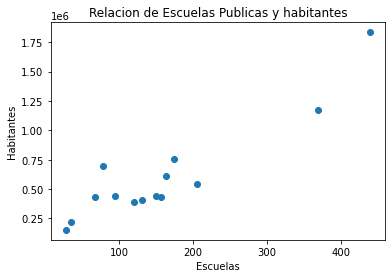

In [108]:
x=escuelasypoblacion.Escuelas
y=escuelasypoblacion.Habitantes
plt.title("Relacion de Escuelas Publicas y habitantes")
plt.xlabel("Escuelas")
plt.ylabel("Habitantes")
plt.scatter(x,y)
plt.savefig("Escuelas Publicas relacion con habitantes",bbox_inches='tight')

In [109]:
escuelasypoblacion[["Escuelas","Habitantes"]].corr()

,Escuelas,Habitantes
Escuelas,1.000000,0.919382
Habitantes,0.919382,1.000000
